# <center>DAV 6150 Module 2 Assignment</center>

## <center>Predicting Curb Weight of Cars: Linear Regression Analysis</center>

<h5 style='text-align: right;'>Naveen Chowdary Aliveli</h5>

## 1. Introduction

In this assignment, I am going to predict the curb weight of a passenger vehicles by constructing a cross validated linear regression model cars considering curb-weight  variable as response variable and explanatory variables as height, width, length, wheel-base,engine-size, horsepower, peak-rpm, and city-mpg.

Steps involved are as follows:

> Exploratory Data Analysis (EDA):
In this step we will exaine the quality of the data like examining the missing values or any outliers and also  will try to find the relationships among the variables if any.

> Regression Model Construction & Evaluation:
In this step we will split the data and fed and then construct a linear regression model and evaluate the model using the K fold crossvalidation method.

> Conclusions:
Finally we will conclude the predicted curb-weight of a passenger vehicle and examine the performance scores of the models.

## 2. Exploratory Data Analysis (EDA)

In [1]:
#Installin all the libraries and packages that are required
! pip install pandas_profiling
! pip install sklearn
! pip install numpy
! pip install pandas
! pip install seaborn
! pip install matplotlib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 352.3/352.3 kB 19.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 11.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 36.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 26.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.4/455.4 kB 24.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 58.8 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=5bd7d415d1a60f780c25c8cd380fa314c872885a7450551acacb93bd469b4228
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attemp

In [2]:
#importing the numpy library
import numpy as np
# load the pandas library
import pandas as pd
# load the train_test_split function from the sklearn.model_selection module
from sklearn.model_selection import train_test_split
#importing the pandas_profiling function from ProfileReport module
from pandas_profiling import ProfileReport
#importing the seaborn library
import seaborn as sns
#importing the matplotlib library
import matplotlib.pyplot as plt
#importing the sklearn.linear_model from LinearRegression module
from sklearn.linear_model import LinearRegression
#importing the sklearn.model_selection from cross_val_score module
from sklearn.model_selection import cross_val_score

<ipython-input-2-cab989f50d4a>:8: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


### Reading the data from the github repository 

In [3]:
#loading the data from github repository using read_csv() and displaying the data and add the column names to the dataframe
column_names=["symboling","normalized-losses","make","fuel-type","aspiration","num-of-doors","body-style","drive-wheels","engine-location","wheel-base","length","width","height","curb-weight","engine-type","num-of-cylinders","engine-size","fuel-system","bore","stroke","compression-ratio","horsepower","peak-rpm","city-mpg","highway-mpg","price"]
data_frame = pd.read_csv('https://raw.githubusercontent.com/naliveli/summer_data_science/main/Week-1/M2_Data.csv',names=column_names)
data_frame

,symboling,normalized-losses,make,fuel-type,aspiration,num-of-doors,body-style,drive-wheels,engine-location,wheel-base,...,engine-size,fuel-system,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
0,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495
1,3,?,alfa-romero,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500
2,1,?,alfa-romero,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500
3,2,164,audi,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.4,10.0,102,5500,24,30,13950
4,2,164,audi,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.4,8.0,115,5500,18,22,17450
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200,-1,95,volvo,gas,std,four,sedan,rwd,front,109.1,...,141,mpfi,3.78,3.15,9.5,114,5400,23,28,16845
201,-1,95,volvo,gas,turbo,four,sedan,rwd,front,109.1,...,141,mpfi,3.78,3.15,8.7,160,5300,19,25,19045
202,-1,95,volvo,gas,std,four,sedan,rwd,front,109.1,...,173,mpfi,3.58,2.87,8.8,134,5500,18,23,21485
203,-1,95,volvo,diesel,turbo,four,sedan,rwd,front,109.1,...,145,idi,3.01,3.4,23.0,106,4800,26,27,22470


In [5]:
# lets check the shape of the dataframe
data_frame.shape

(205, 26)

In [6]:
data_frame.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205 entries, 0 to 204
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   symboling          205 non-null    int64  
 1   normalized-losses  205 non-null    object 
 2   make               205 non-null    object 
 3   fuel-type          205 non-null    object 
 4   aspiration         205 non-null    object 
 5   num-of-doors       205 non-null    object 
 6   body-style         205 non-null    object 
 7   drive-wheels       205 non-null    object 
 8   engine-location    205 non-null    object 
 9   wheel-base         205 non-null    float64
 10  length             205 non-null    float64
 11  width              205 non-null    float64
 12  height             205 non-null    float64
 13  curb-weight        205 non-null    int64  
 14  engine-type        205 non-null    object 
 15  num-of-cylinders   205 non-null    object 
 16  engine-size        205 non

In [7]:
#removing null values to make data consistent if any
data_frame.dropna(inplace=True)
data_frame.shape

(205, 26)

### Cleaning the data
By examining the data I found that some data is missing and it was filled with special character '?' so lets remove that.

In [8]:
# Checking for missing values
data_frame[data_frame == '?'].count()


symboling             0
normalized-losses    41
make                  0
fuel-type             0
aspiration            0
num-of-doors          2
body-style            0
drive-wheels          0
engine-location       0
wheel-base            0
length                0
width                 0
height                0
curb-weight           0
engine-type           0
num-of-cylinders      0
engine-size           0
fuel-system           0
bore                  4
stroke                4
compression-ratio     0
horsepower            2
peak-rpm              2
city-mpg              0
highway-mpg           0
price                 4
dtype: int64

As it was mentioned in the assignmnet that "The explanatory variables you may choose from are as follows: height, width, length, wheel-base, engine-size, horsepower, peak-rpm, and city-mpg. All other attributes contained within the data set should be ignored for this Assignment."
so we remove the special characted from the atributes : horsepower and peak-rpm

In [9]:
#replacing special character '?' with NaN
data_frame['horsepower']=data_frame['horsepower'].replace('?', np.nan)
data_frame['peak-rpm']=data_frame['peak-rpm'].replace('?', np.nan)
# dropping the NaN values olny in columns peak-rpm and horsepower
data_frame = data_frame.dropna(subset=['peak-rpm', 'horsepower'], how='all')
data_frame.shape

(203, 26)

In [10]:
# Now lets check for missing values in attributes horsepower and peak-rpm
data_frame[data_frame == '?'].count()
#we can see zero for both of them

symboling             0
normalized-losses    39
make                  0
fuel-type             0
aspiration            0
num-of-doors          2
body-style            0
drive-wheels          0
engine-location       0
wheel-base            0
length                0
width                 0
height                0
curb-weight           0
engine-type           0
num-of-cylinders      0
engine-size           0
fuel-system           0
bore                  4
stroke                4
compression-ratio     0
horsepower            0
peak-rpm              0
city-mpg              0
highway-mpg           0
price                 4
dtype: int64

Converting the object to float data types

In [11]:
data_frame[['horsepower','peak-rpm']] = data_frame[['horsepower','peak-rpm']].astype(float)

<ipython-input-11-ecbf7f46e840>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_frame[['horsepower','peak-rpm']] = data_frame[['horsepower','peak-rpm']].astype(float)


### Examining the data set


In [12]:
#lets cehck the statistics of numerical attributes in the datset
data_frame.describe()

,symboling,wheel-base,length,width,height,curb-weight,engine-size,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg
count,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000,203.000000
mean,0.832512,98.782759,173.999015,65.901478,53.733498,2555.921182,126.857143,10.156749,104.256158,5125.369458,25.241379,30.748768
std,1.247384,6.045680,12.385511,2.154835,2.442864,523.205555,41.845239,3.989048,39.714369,479.334560,6.570702,6.920406
min,-2.000000,86.600000,141.100000,60.300000,47.800000,1488.000000,61.000000,7.000000,48.000000,4150.000000,13.000000,16.000000
25%,0.000000,94.500000,166.300000,64.050000,52.000000,2145.000000,97.000000,8.550000,70.000000,4800.000000,19.000000,25.000000
50%,1.000000,97.000000,173.200000,65.500000,54.100000,2414.000000,119.000000,9.000000,95.000000,5200.000000,24.000000,30.000000
75%,2.000000,102.400000,183.300000,66.900000,55.500000,2943.500000,143.000000,9.400000,116.000000,5500.000000,30.000000,35.000000
max,3.000000,120.900000,208.100000,72.300000,59.800000,4066.000000,326.000000,23.000000,288.000000,6600.000000,49.000000,54.000000


### Bar Plot for car Make

Text(0, 0.5, 'Count')

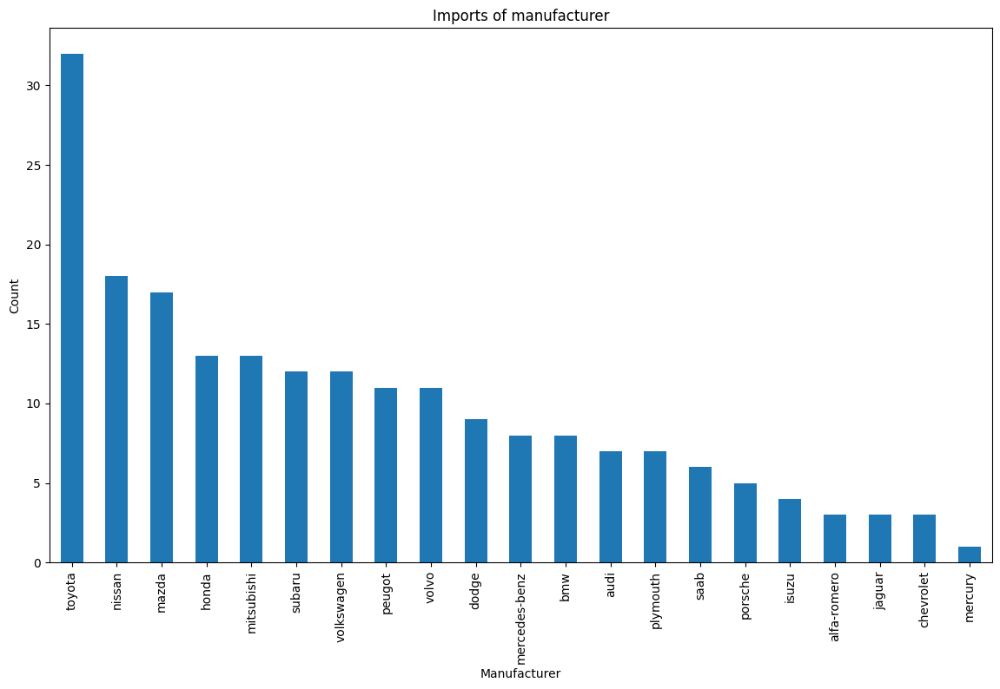

In [13]:
# Bar plot 
make_plot = data_frame['make'].value_counts().plot(kind='bar',
                                    figsize=(14,8),
                                    title="Imports of manufacturer")
make_plot.set_xlabel("Manufacturer")
make_plot.set_ylabel("Count")

From the above plot we can observe that the car maker toyota has large number of imports follwed by Nissan and mercury being the least

### Bar plot for Tye of Fuel used 

Text(0, 0.5, 'Count')

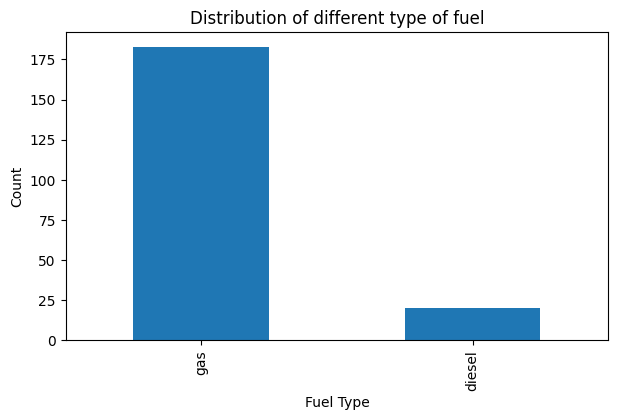

In [14]:
# Bar plot 
make_plot = data_frame['fuel-type'].value_counts().plot(kind='bar',
                                    figsize=(7,4),
                                    title="Distribution of different type of fuel")
make_plot.set_xlabel("Fuel Type")
make_plot.set_ylabel("Count")

More vehicles are using the Gas than diesel and the different is very considerable

### Car body type VS Make

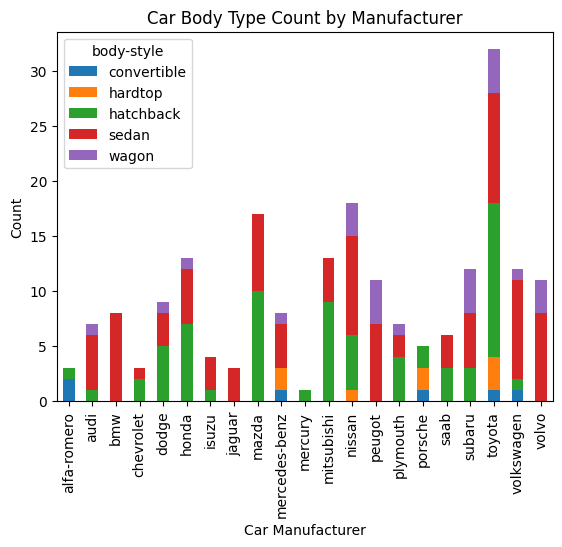

In [15]:
import matplotlib.pyplot as plt


# Example data
# df = pd.DataFrame({
#     'car_body_type': ['Sedan', 'SUV', 'Hatchback', 'Sedan', 'SUV', 'SUV', 'Hatchback'],
#     'car_manufacturer': ['Toyota', 'Toyota', 'Honda', 'Honda', 'Toyota', 'Honda', 'Toyota']
# })

# Group by car manufacturer and car body type, and count occurrences
grouped = data_frame.groupby(['make', 'body-style']).size().unstack(fill_value=0)

# Plotting the grouped bar chart
grouped.plot(kind='bar', stacked=True)

# Add labels and title
plt.xlabel('Car Manufacturer')
plt.ylabel('Count')
plt.title('Car Body Type Count by Manufacturer')

# Show the plot
plt.show()


### Lets create a dataframe with the attributes which were in the scope 

In [16]:
data_frame1=data_frame[["height","width","length","wheel-base","engine-size","horsepower","peak-rpm","city-mpg",'curb-weight']]
data_frame1

,height,width,length,wheel-base,engine-size,horsepower,peak-rpm,city-mpg,curb-weight
0,48.8,64.1,168.8,88.6,130,111.0,5000.0,21,2548
1,48.8,64.1,168.8,88.6,130,111.0,5000.0,21,2548
2,52.4,65.5,171.2,94.5,152,154.0,5000.0,19,2823
3,54.3,66.2,176.6,99.8,109,102.0,5500.0,24,2337
4,54.3,66.4,176.6,99.4,136,115.0,5500.0,18,2824
...,...,...,...,...,...,...,...,...,...
200,55.5,68.9,188.8,109.1,141,114.0,5400.0,23,2952
201,55.5,68.8,188.8,109.1,141,160.0,5300.0,19,3049
202,55.5,68.9,188.8,109.1,173,134.0,5500.0,18,3012
203,55.5,68.9,188.8,109.1,145,106.0,4800.0,26,3217


### Correlation

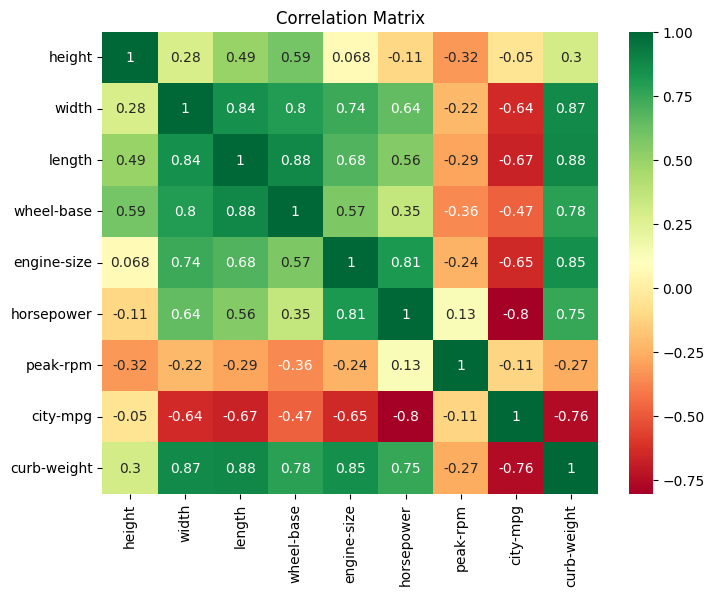

In [17]:
correlation_matrix = data_frame1.corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap="RdYlGn")
plt.title('Correlation Matrix')
plt.show()

>1.From the above heatmap, There is a strong positive correlation of 0.88 for length and wheel base which menas that increase in wheel-base might also increase in length.

>2.Similarly we can see a strong positive relation between width and curb weight

>3.Curb weight also depends on length , width ,engine size and wheel-base

>4.Strong positive relation between horsepower and engine size

>5.curb-weight strongly depends on length and width

### Box Plots

<Axes: >

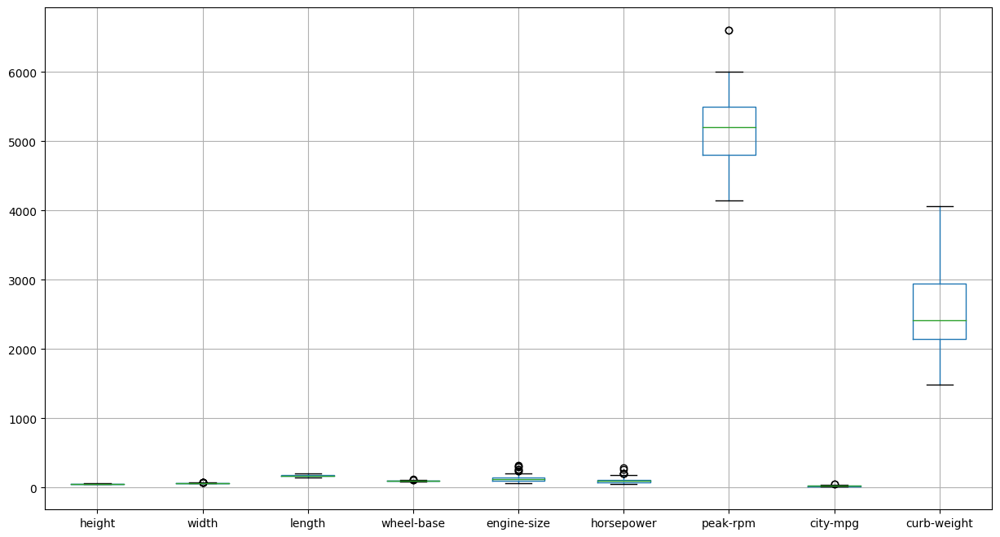

In [18]:
data_frame1.boxplot(column = ["height","width","length","wheel-base","engine-size","horsepower","peak-rpm","city-mpg","curb-weight"], figsize=(15, 8))

From the above box plot we can see some 1 outlier in width, wheel-base and city-mpg and 2 outliers in engine-size and horsepower.As these were negligable compared to the size of the data set(205),ignoring them.

### Histograms with denstity curve

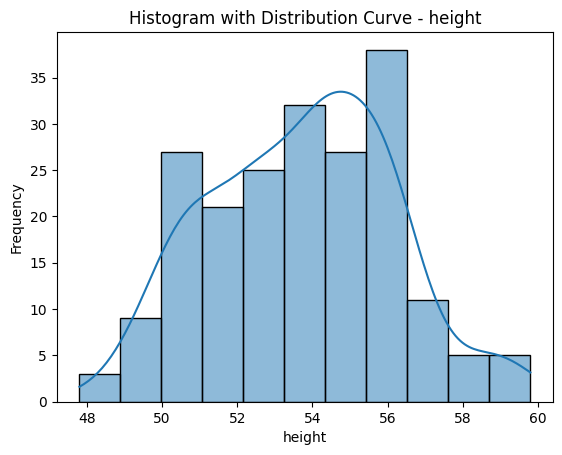

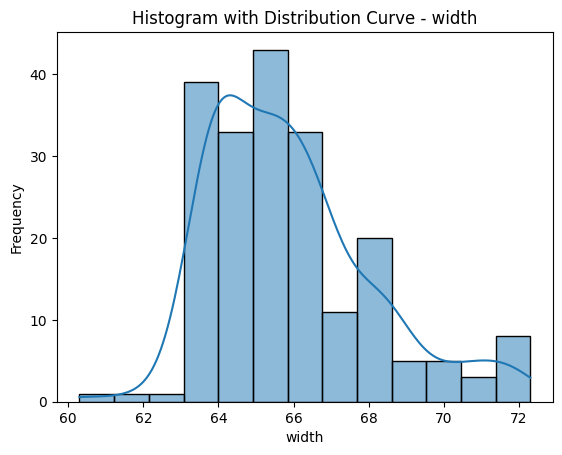

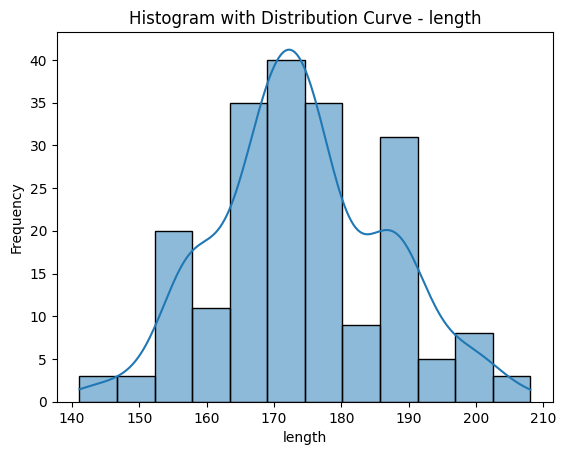

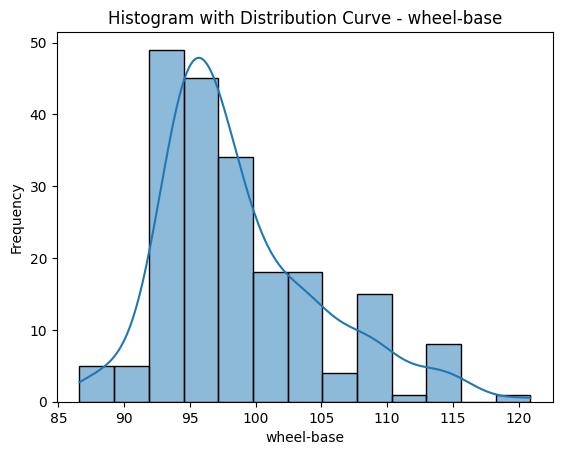

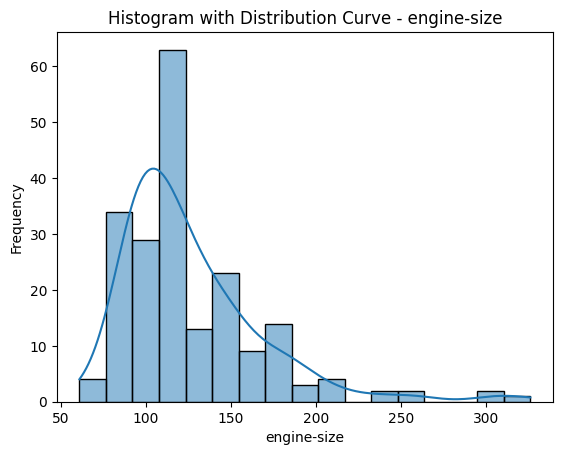

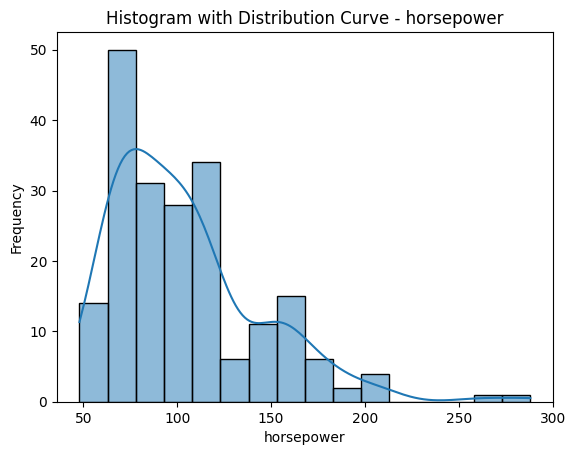

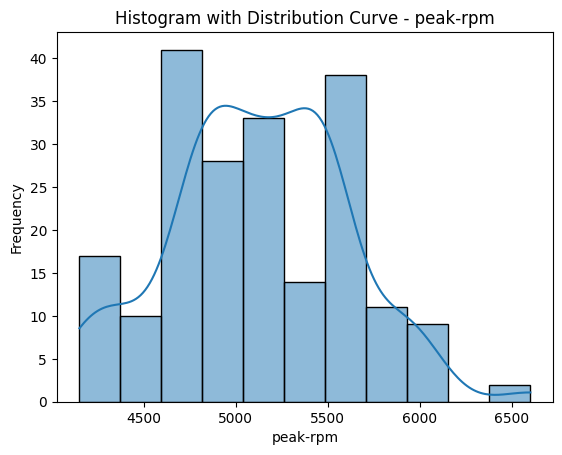

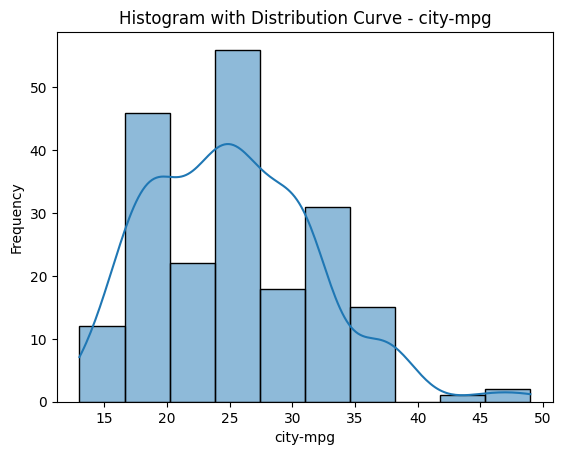

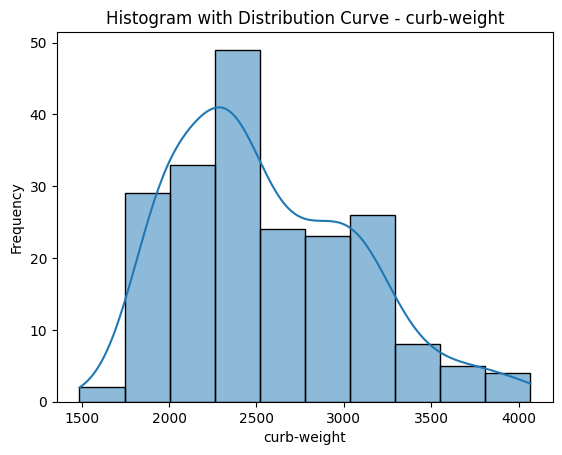

In [19]:
#_=data_frame1.hist(bins=9,density=True,figsize=(15, 10))
for column in data_frame1.columns:
    plt.figure()
    sns.histplot(data_frame1[column], kde=True)
    plt.title(f'Histogram with Distribution Curve - {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()



### Deep dive into the attributes and its relations

In [20]:
report = ProfileReport(data_frame)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# 3. Regression Model Construction & Evaluation

In [21]:
#  curb-weight is the response variable and height, width, length, wheel-base, engine-size, horsepower, peak-rpm, and city-mpg are the exploratory variables
y1 = data_frame1['curb-weight']
y2 = data_frame1['curb-weight']
y1.head()

0    2548
1    2548
2    2823
3    2337
4    2824
Name: curb-weight, dtype: int64

In [22]:
# If you want to preserve the original dataframe in its entirety, make a copy of the original dataframe 
# so that the original is preserved
X = data_frame1.copy()

In [23]:
# now drop the curb-weight column from 'X' so that the response variable is removed from the explanatory variables
X.drop('curb-weight', axis=1, inplace=True)

In [24]:
# The curb-weight column has been removed from the data set
X.head()

,height,width,length,wheel-base,engine-size,horsepower,peak-rpm,city-mpg
0,48.8,64.1,168.8,88.6,130,111.0,5000.0,21
1,48.8,64.1,168.8,88.6,130,111.0,5000.0,21
2,52.4,65.5,171.2,94.5,152,154.0,5000.0,19
3,54.3,66.2,176.6,99.8,109,102.0,5500.0,24
4,54.3,66.4,176.6,99.4,136,115.0,5500.0,18


In [25]:
X1 = X[['peak-rpm', 'horsepower', 'engine-size']]
X2 = X[['length', 'width', 'height']]
print(X1.head())
X2.head()

   peak-rpm  horsepower  engine-size
0    5000.0       111.0          130
1    5000.0       111.0          130
2    5000.0       154.0          152
3    5500.0       102.0          109
4    5500.0       115.0          136


,length,width,height
0,168.8,64.1,48.8
1,168.8,64.1,48.8
2,171.2,65.5,52.4
3,176.6,66.2,54.3
4,176.6,66.4,54.3


### Model 1

In [26]:
# Now split the data into training and testing subsets. 
# We'll set aside 30% of the data for testing purposes;
# specifying random state value if you want to have the ability to reproduce the exact same training + testing subsets repeatedly
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.3, random_state=12)

### Model 2

In [27]:
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.3, random_state=12)

In [28]:
# Let's check the results
print(len(X1_train))
print(len(X2_train))
print(len(X1_test))
print(len(X2_test))

142
142
61
61


In [29]:
# Let's check the row indices of the new objects to see whether they match
print(y1_test.head())
print(X1_test.head())
print(y2_test.head())
print(X2_test.head())

204    3062
190    2221
23     2128
186    2275
11     2395
Name: curb-weight, dtype: int64
     peak-rpm  horsepower  engine-size
204    5400.0       114.0          141
190    5500.0        90.0          109
23     5500.0       102.0           98
186    5250.0        85.0          109
11     5800.0       101.0          108
204    3062
190    2221
23     2128
186    2275
11     2395
Name: curb-weight, dtype: int64
     length  width  height
204   188.8   68.9    55.5
190   165.7   64.0    51.4
23    157.3   63.8    50.8
186   171.7   65.5    55.7
11    176.8   64.8    54.3


In [30]:
print(X1_train.head())
print(y1_train.head())
print(X1_train.head())
print(X1_train.head())

     peak-rpm  horsepower  engine-size
95     5200.0        69.0           97
45     5400.0        70.0           90
133    5250.0       110.0          121
33     6000.0        76.0           92
134    5250.0       110.0          121
95     2028
45     1909
133    2695
33     1940
134    2707
Name: curb-weight, dtype: int64
     peak-rpm  horsepower  engine-size
95     5200.0        69.0           97
45     5400.0        70.0           90
133    5250.0       110.0          121
33     6000.0        76.0           92
134    5250.0       110.0          121
     peak-rpm  horsepower  engine-size
95     5200.0        69.0           97
45     5400.0        70.0           90
133    5250.0       110.0          121
33     6000.0        76.0           92
134    5250.0       110.0          121


In [31]:
y1_train.head()

95     2028
45     1909
133    2695
33     1940
134    2707
Name: curb-weight, dtype: int64

 Data set has been split into training and testing data subsets.
 >1. Initially we separated the response variable "curb-weight" from the explanatory variables.
 
 >2. With the help train_test_split() function we made a train and test data sets.Here we use 30% of data for testing and remaining for training.


### Linear Regression Models
To develop a predictive models for curb weight based on the provided explanatory variables, we employ a linear regression approach. The linear regression models are trained using the available training data, enabling them to learn the underlying patterns and relationships between the independent variables and the target variable. By fitting the models to the training data, we aim to estimate the coefficients that define the linear relationship between the explanatory variables and curb weight. This models will serve as a basis for making predictions on new, unseen data points.

In [32]:
# Constructing a linear regression model
model1 = LinearRegression()
model2 = LinearRegression()

# Fitting the model to the training data
model1.fit(X1_train, y1_train)
model2.fit(X2_train, y2_train)

LinearRegression()

In [33]:

# Evaluate Model 1 using K-fold cross-validation
model1_scores = cross_val_score(model1, X1_test, y1_test, cv=5)
model1_avg_score = model1_scores.mean()

# Evaluate Model 2 using K-fold cross-validation
model2_scores = cross_val_score(model2, X2_test, y2_test, cv=5)
model2_avg_score = model2_scores.mean()

print("Model1 Score: ", model1_avg_score)
print("Model2 Score: ", model2_avg_score)

Model1 Score:  0.615266795140342
Model2 Score:  0.7194516674594451


# 4. Conclusion

Hence we developed  a twolinear regression  models to predict a curb weight  with average scores of 0.61 and 0.71  from which shows that model 2 has better performance than model 1.

And also found that there is strong positive correlation of 0.88, 0.87, 8.85 between the curb-weight and length, width, engine-size respectively.